# Football leagues and country relationships

Football is international. The clubs in the top leagues of the different countries in the world are buying players from different nationalities trying the get the best team. But do all countries contribute and benefit equally to international football? And are players mainly shared within the continents, or are they shared all across the world?

To do this, data for over 33.000 footbal players has been collected.

The data is collected from www.bold.dk where 3.3GB of HTML has been converted into 2.5MB CSV file.

The news that will be used later in the notebook has been collected from www.skysports.com where 140MB HTML have been converted to 6 textfiles with around 120 news in each.

Link to webpage: https://frederikagerkvist.wixsite.com/website

In [1]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
import math, community, os, csv, nltk, string, statistics
from nltk.stem import LancasterStemmer
from wordcloud import WordCloud, STOPWORDS
from scipy.misc.pilutil import imread

In [2]:
#Setting parameters for figures
plt.rcParams['figure.figsize'] = [20, 14]
COLOR = '#B38A4C'
plt.rcParams['text.color'] = COLOR
plt.rcParams['axes.labelcolor'] = COLOR
plt.rcParams['xtick.color'] = COLOR
plt.rcParams['ytick.color'] = COLOR
params = {'legend.fontsize': 16,
          'legend.handlelength': 2}
plt.rcParams.update(params)

In [3]:
playerData = pd.read_csv("playerData.csv")
playerData.head(10)

,name,position,nationality,age,height,weight,club,club_nationality,club-league
0,alisson-becker,Goalkeeper,brasilien,27,193,91,liverpool,england,premier-league
1,nathaniel-clyne,Defender,england,28,175,67,liverpool,england,premier-league
2,fabinho,Midtfielder,brasilien,26,188,78,liverpool,england,premier-league
3,virgil-van-dijk,Defender,holland,28,193,92,liverpool,england,premier-league
4,georginio-wijnaldum,Midtfielder,holland,28,175,74,liverpool,england,premier-league
5,dejan-lovren,Defender,kroatien,30,188,84,liverpool,england,premier-league
6,james-milner,Midtfielder,england,33,175,70,liverpool,england,premier-league
7,naby-keita,Midtfielder,guinea,24,172,64,liverpool,england,premier-league
8,roberto-firmino,Attacker,brasilien,28,181,76,liverpool,england,premier-league
9,sadio-mane,Attacker,senegal,27,175,69,liverpool,england,premier-league


As the table above shows, a player is defined by his name, position on the pitch, nationality, age, height, weight, the club he plays in, the country his club is in and which league he plays in.

So now the graph can be created. The nodes will be the countries in the world. And then an edge between two countries exists, if a player is from one country and plays in another country. 

So for instance the first player in the table above: Alisson is from Brazil and plays in an English club. So an edge from Brazil to England is created. 

The weight of the edges will then increase, when multiple players are connected the same way.

In [4]:
#Creating the graph.
G = nx.DiGraph()
for i, nationality in enumerate(playerData["nationality"]) :
    nationality = nationality.lower()
    club_nationality = playerData["club_nationality"][i].lower()
    if nationality != club_nationality :
        if G.has_edge(nationality, club_nationality) :
            G[nationality][club_nationality]["weight"] += 1
        else :
            G.add_edge(nationality, club_nationality, weight = 1)

In [5]:
nodesAmount = len(G.nodes())
edgesAmount = len(G.edges())
print("The graph contains {} different nodes and {} different edges".format(nodesAmount,edgesAmount))

The graph contains 179 different nodes and 2561 different edges







The below three code cells will first load in the GPS coordinates of the different countries from a CSV file, so they are ready to be plotted on a map. Then functions for plotting the World- and Europe map are created, so it will be easy to plot with different sizes and colors.

In [6]:
# load geographic coordinate system for countries
country = [row[0].strip() for row in csv.reader(open('LonLat.csv'), delimiter=';')]
lat = [float(row[1]) for row in csv.reader(open('LonLat.csv'), delimiter=';')]
lon = [float(row[2]) for row in csv.reader(open('LonLat.csv'), delimiter=';')]

In [7]:
#Function for drawing the world map with sizes of nodes as input
def drawWorldMap(sizes, colors, label) :
    os.environ['PROJ_LIB'] = 'C:/Users/schmi/Anaconda3/Lib/site-packages/mpl_toolkits/basemap'
    from mpl_toolkits.basemap import Basemap

    #Define the basemap projection
    m = Basemap(projection='robin', lon_0=0, resolution='c')

    # define position in basemap
    position = {}
    for i in range(0, len(country)):
        position[country[i]] = m(lon[i], lat[i])

    #Draw the map
    m.drawcountries(linewidth = 0.5)
    m.drawmapboundary(fill_color='#027eb3')
    m.fillcontinents(color='#4cba2b',lake_color='#027eb3')
    m.drawcoastlines(linewidth=0.5)

    #Gets the weight for the edges
    edge, weights = zip(*nx.get_edge_attributes(G, "weight").items())

    #Draws the nodes and edges
    nx.draw_networkx_nodes(G, pos=position, 
                           node_size = sizes,
                           node_color = colors, node_shape='o', alpha=0.95)
    nx.draw_networkx_edges(G, pos=position, edge_cmap=plt.cm.gray_r, width = 0.75, alpha=0.2, 
                           edge_color=[math.log10(w)+1 for w in weights])
    plt.title("World - {}".format(label), fontsize=20)
    plt.savefig('Figures/World - {}.png'.format(label), bbox_inches='tight', transparent=True)
    plt.show()

In [8]:
#Function for drawing the Europe map with sizes of nodes as input
def drawEuropeMap(sizes, colors, label) :
    os.environ['PROJ_LIB'] = 'C:/Users/schmi/Anaconda3/Lib/site-packages/mpl_toolkits/basemap'
    from mpl_toolkits.basemap import Basemap
    
    #Define the basemap projection
    m = Basemap(resolution='l',projection='merc',lat_ts=0,lat_0=55,lon_0=25., area_thresh=1000,
           llcrnrlon=-22, llcrnrlat=30,
           urcrnrlon=40, urcrnrlat=66)

    # define position in basemap
    position = {}
    for i in range(0, len(country)):
        position[country[i]] = m(lon[i], lat[i])

    #Draw the map
    m.drawcountries(linewidth = 0.5)
    m.drawmapboundary(fill_color='#027eb3')
    m.fillcontinents(color='#4cba2b',lake_color='#027eb3')
    m.drawcoastlines(linewidth=0.5)

    #Gets the weight for the edges
    edge, weights = zip(*nx.get_edge_attributes(G, "weight").items())

    #Draws the nodes and edges
    nx.draw_networkx_nodes(G, pos=position, 
                           node_size = sizes,
                           node_color = colors, node_shape='o', alpha=0.95)
    nx.draw_networkx_edges(G, pos=position, edge_cmap=plt.cm.gray_r, width = 0.75, alpha=0.2, 
                           edge_color=[math.log10(w)+1 for w in weights], font_size=18)
    plt.title("Europe - {}".format(label), fontsize=20)
    plt.savefig('Figures/Europe - {}.png'.format(label), bbox_inches='tight', transparent=True)
    plt.show()

# Football Diversity

This section looks into how the different countries are contributing with players to international football. It will shows the countries who contributes the most, benefits the most and which countries are central. It will also see how the network can be partioned and if a partition based on continent location is a good partition.

C:\Users\schmi\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  import sys
C:\Users\schmi\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  from ipykernel import kernelapp as app


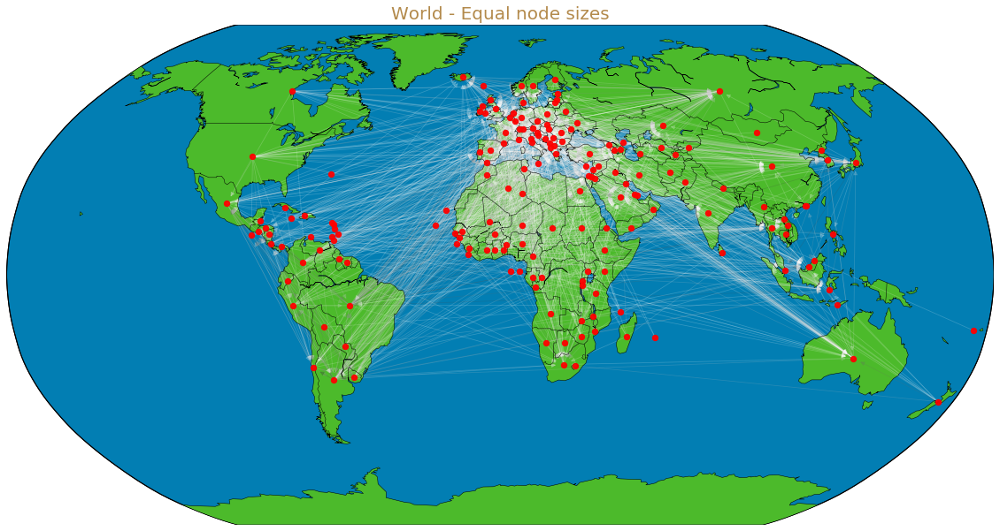

In [9]:
drawWorldMap(40, 'red', "Equal node sizes")

As it can be seen from above figure players are moving across the world to play football. It can also be seen that Europe is where it is most dense, which is because there exists many small countries and Europe is where football is most recognized.

C:\Users\schmi\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  if __name__ == '__main__':
C:\Users\schmi\Anaconda3\lib\site-packages\ipykernel_launcher.py:17: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.


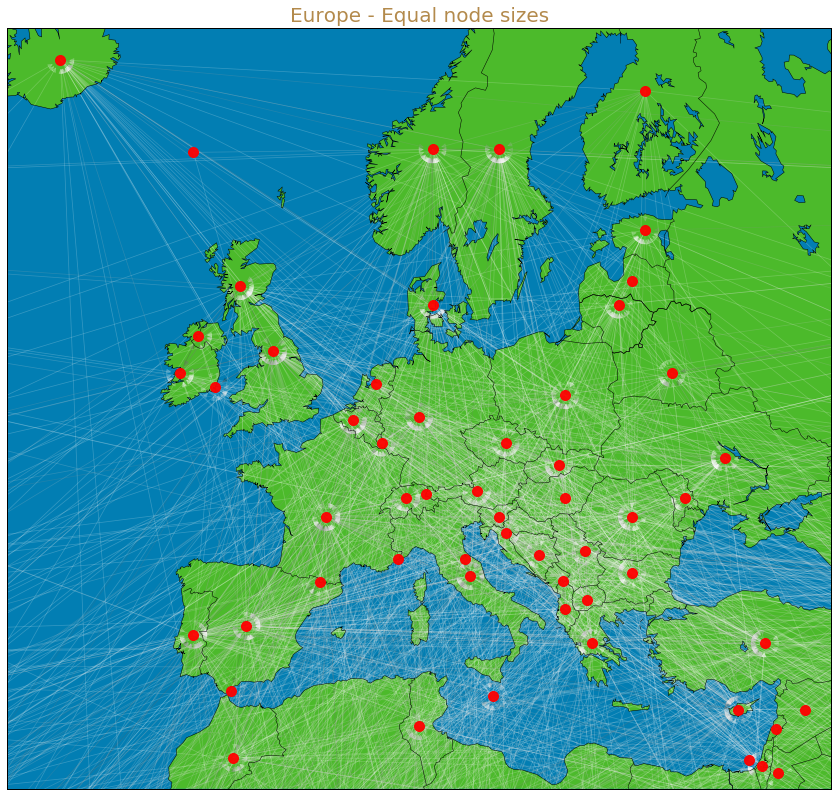

In [10]:
drawEuropeMap(100, 'red', "Equal node sizes")

Zoomed in on Europe it is possible to see that the different countries definitely are contributing to European football. It can also be seen that many edges are connected to Africa and South America, where only a fewer edges are connected to Asia.

C:\Users\schmi\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  import sys
C:\Users\schmi\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  from ipykernel import kernelapp as app


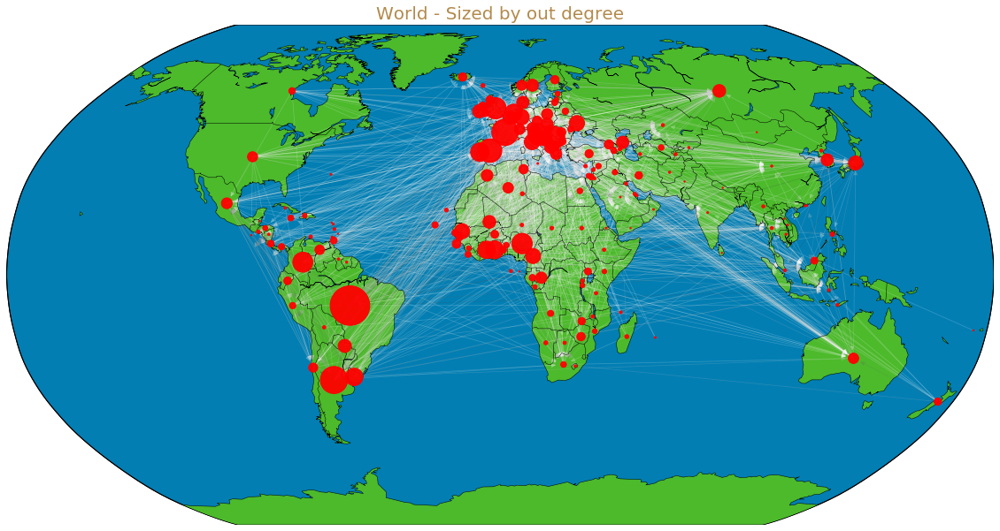

In [11]:
outDegreeSizes = [b*2 for a,b in list(G.out_degree(weight="weight"))]
drawWorldMap(outDegreeSizes, 'red', "Sized by out degree")

If the country nodes are sized by their out degree it can be seen that those countries who contributes the most to international football are European countries, South American countries and the African countries in the Middle West. And in particular Brazil and Argentina are contributing a lot.

C:\Users\schmi\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  if __name__ == '__main__':
C:\Users\schmi\Anaconda3\lib\site-packages\ipykernel_launcher.py:17: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.


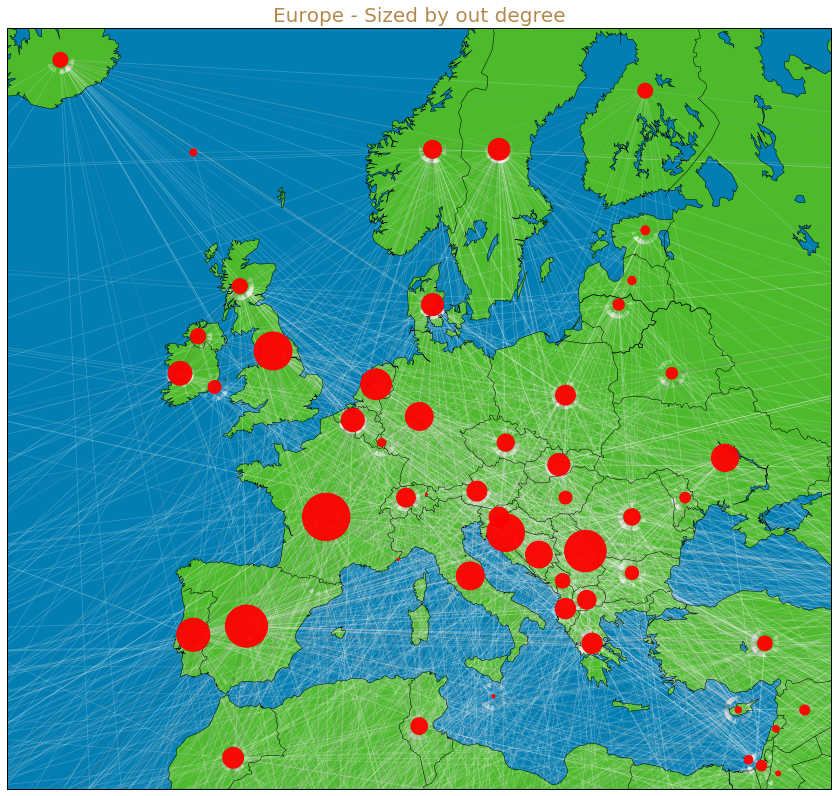

In [12]:
outDegreeSizes = [b*5 for a,b in list(G.out_degree(weight="weight"))]
drawEuropeMap(outDegreeSizes, 'red', "Sized by out degree")

When only looking at Europe, it is possible to see that it is France, Spain, England, Serbia and Croatia who are contributing the most to international football.

C:\Users\schmi\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  import sys
C:\Users\schmi\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  from ipykernel import kernelapp as app


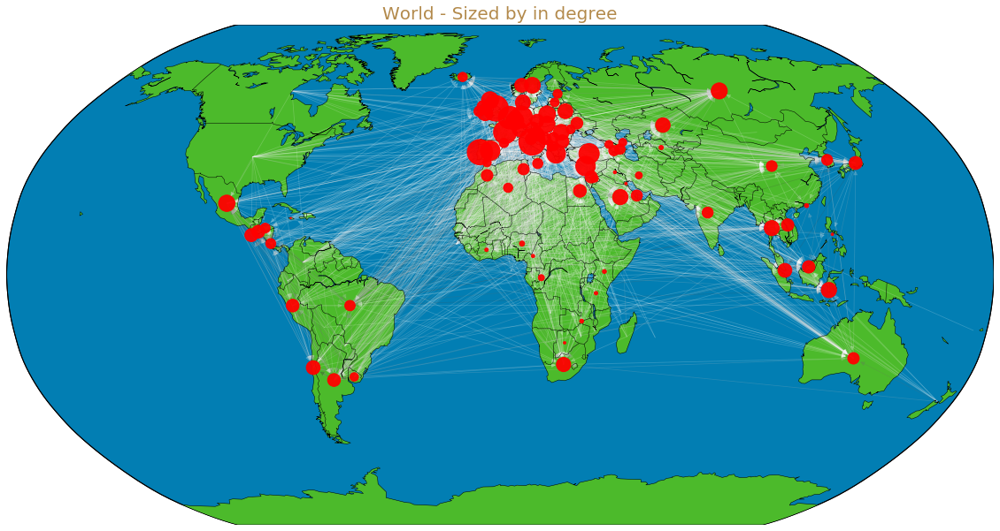

In [13]:
inDegreeSizes = [b*2 for a,b in list(G.in_degree(weight="weight"))]
drawWorldMap(inDegreeSizes, 'red', "Sized by in degree")

When it comes to in degrees it can be seen the it is mostly Europe who benifits the most from international players. That can be due to the clubs in the european countries are richer and football in general is more recognized in Europe.

C:\Users\schmi\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  if __name__ == '__main__':
C:\Users\schmi\Anaconda3\lib\site-packages\ipykernel_launcher.py:17: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.


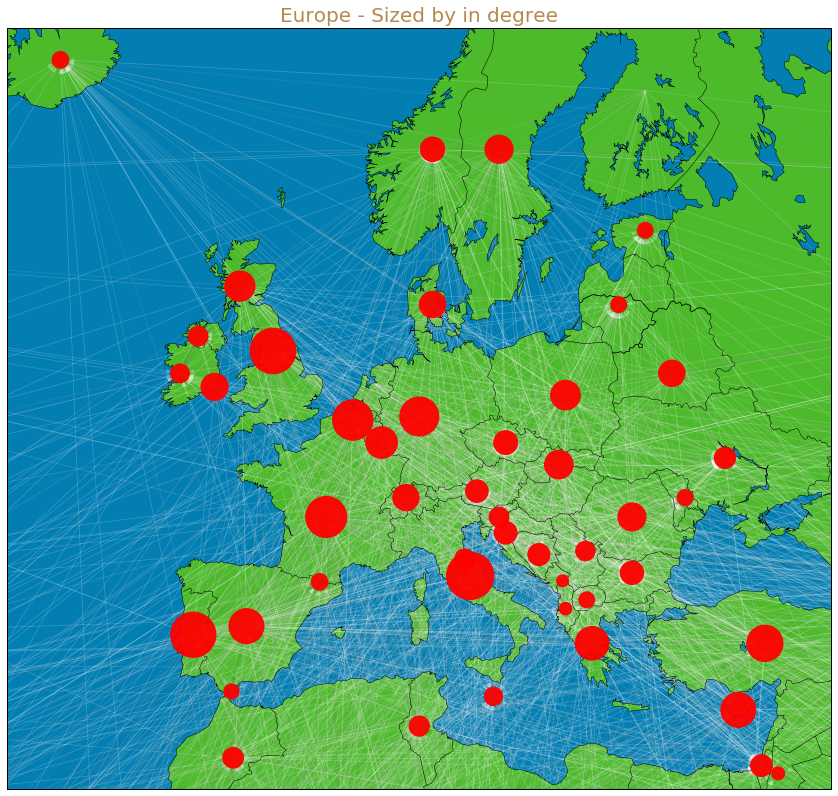

In [14]:
inDegreeSizes = [b*5 for a,b in list(G.in_degree(weight="weight"))]
drawEuropeMap(inDegreeSizes, 'red', "Sized by in degree")

When looking at Europe it can be seen that it is the countries wih the biggest leagues, who benefits the most from international players. So that is countries like Portugal, Italy, Spain, France, England, Netherlands and Germany.

C:\Users\schmi\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  import sys
C:\Users\schmi\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  from ipykernel import kernelapp as app


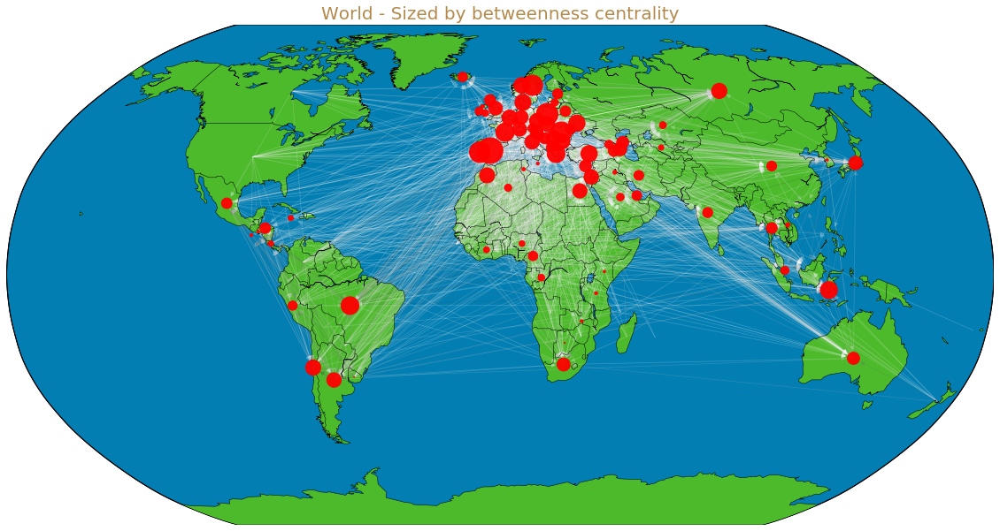

In [15]:
betweens = nx.betweenness_centrality(G, weight="weight")
betweenessSizes = [v*20000 for v in betweens.values()]
drawWorldMap(betweenessSizes, 'red', 'Sized by betweenness centrality')

When looking at the countries sized by their betweeness centrality it can be seen hat the countries in Europe are the biggest along with Brazil, Argentina, Chile and Indonesia. That means European countries are the most connected to all the countries. This realtes to the europeand countries are using players of many different nationalities.

C:\Users\schmi\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  if __name__ == '__main__':
C:\Users\schmi\Anaconda3\lib\site-packages\ipykernel_launcher.py:17: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.


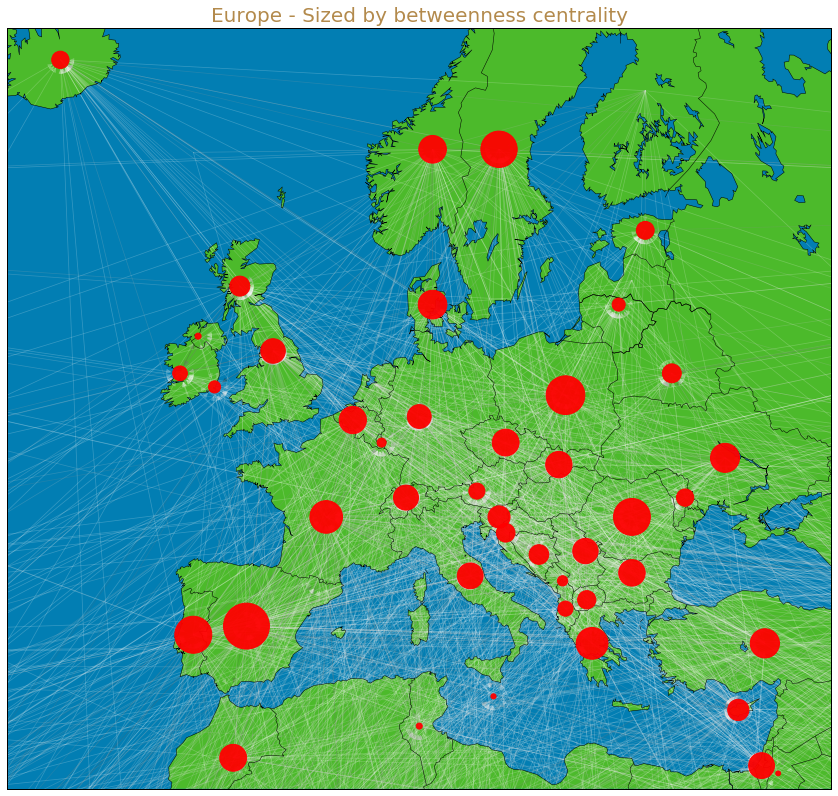

In [16]:
betweenessSizes = [v*50000 for v in betweens.values()]
drawEuropeMap(betweenessSizes, 'red', 'Sized by betweenness centrality')

So when looking a Europe it is countries as Spain, Portugal, Sweden, Polen and Romainia who are the most between central countries, which means they are the countries who uses players with the most different nationalities.

C:\Users\schmi\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  import sys
C:\Users\schmi\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  from ipykernel import kernelapp as app


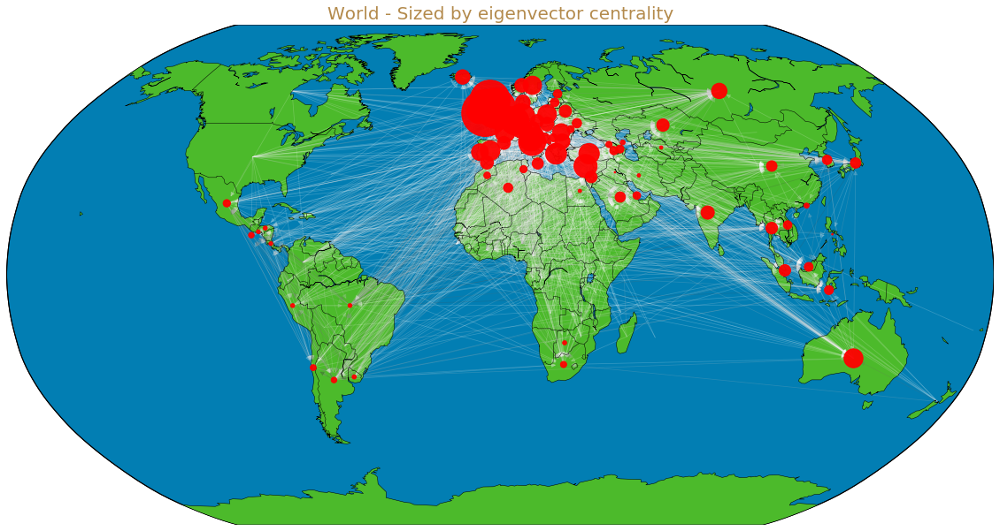

In [17]:
eigens = nx.eigenvector_centrality(G, weight="weight")
eigenSizes = [v*5000 for v in eigens.values()]
drawWorldMap(eigenSizes, 'red', 'Sized by eigenvector centrality')

When the counries are sized by their eigenvector centrality it is again Europe who has the most countries with the biggest nodes. Countries with a high eigenvector centrality are countries which are connected to other countries with a high eigenvector centrality. This could mean the european countries are the most interconnected and they share many player between the clubs in the european countries.

C:\Users\schmi\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  if __name__ == '__main__':
C:\Users\schmi\Anaconda3\lib\site-packages\ipykernel_launcher.py:17: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.


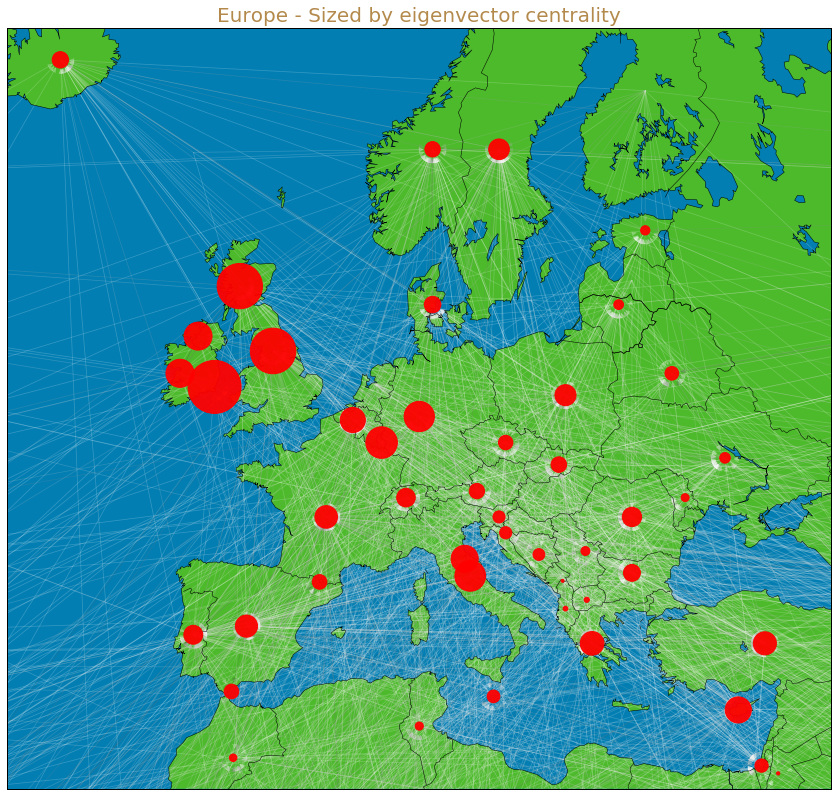

In [18]:
eigenSizes = [v*5000 for v in eigens.values()]
drawEuropeMap(eigenSizes, 'red', 'Sized by eigenvector centrality')

When only viewing Europe, it is mainly the countries of Great Britain along with Luxembourg, Germany, Italy and Sanm Mrino who has a high eigenvector centrality. 

In [19]:
GU = G.to_undirected()
partition = community.best_partition(GU, random_state=1337)
modularity = community.modularity(partition,GU)
print(modularity)

0.3089530905306972


C:\Users\schmi\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  import sys
C:\Users\schmi\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  from ipykernel import kernelapp as app


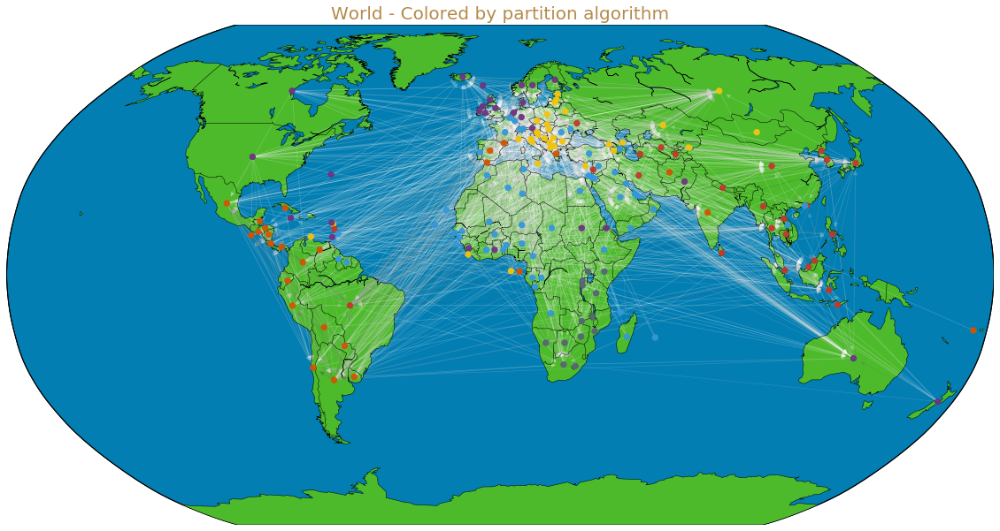

In [20]:
partitionColors = ['#C0392B', '#6C3483', '#F1C40F', '#3498DB', '#D35400', '#566573']
colorsPartition = [partitionColors[partition[n]] for n in G.nodes]
drawWorldMap(40, colorsPartition, 'Colored by partition algorithm')

When using a partition algorithm to compute the best partition, the partition only gets a modularity of 0.30, which is a low modularity. This means that it is not easy to divide the countries into partitions that are not connected by many edges. This is equal to countries are very internationally connected.

But as it can be seen from the map above, it lloks like the partion is more or less partioned into partitions based on their location, which makes sense. So for instance South America players are more likely to play in other South American countries. And the same with, south Africa, North Africa and Asia.

C:\Users\schmi\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  if __name__ == '__main__':
C:\Users\schmi\Anaconda3\lib\site-packages\ipykernel_launcher.py:17: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.


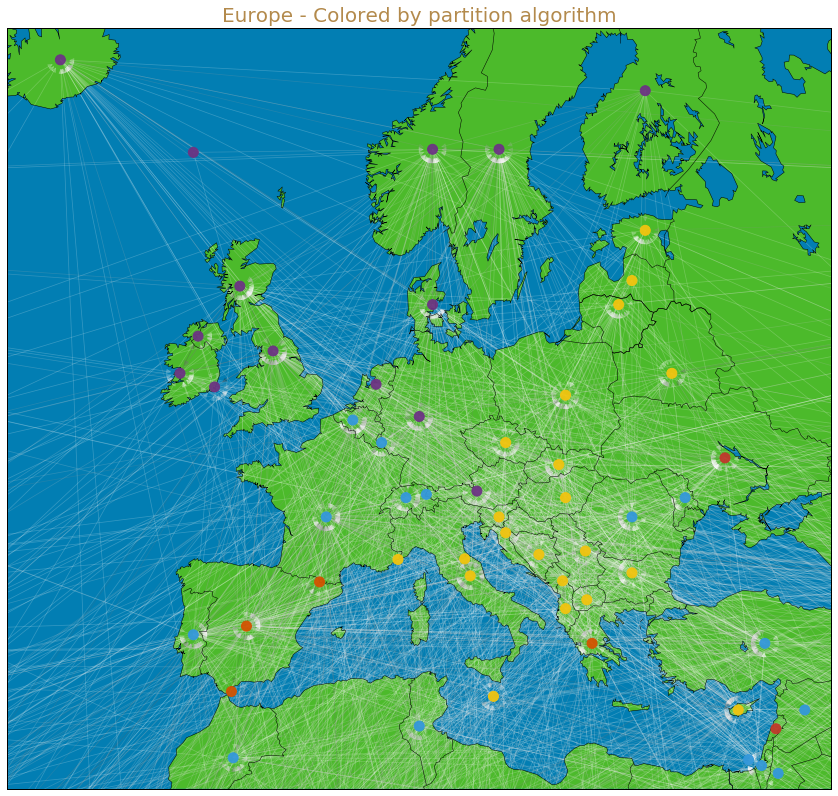

In [21]:
drawEuropeMap(100, colorsPartition, 'Colored by partition algorithm')

When it comes to Europe, it can be seen that it is not all just one partition. It is more partioned into North Europe, West Europe and East Europe. But in general Europe is not just one partition. 

In [22]:
#Create a dictionary with a countries and their continent from a file
continentMap = {}
with open('partition.txt') as openfileobject:
    for line in openfileobject:
        c, continent = line.strip().split(",")
        continentMap[c] = continent
    openfileobject.close()

#Assign colors to the different continents
continentToColor = {
    'asia' : '#145A32',
    'africa' : '#6E2C00',
    'europe' : '#154360',
    'south-america' : '#C0392B',
    'north-america' : '#F1C40F',
    'australia' : '#4A235A'
}

In [23]:
modularity = community.modularity(continentMap,GU)
print("The modularity where the countries are partioned by their continent is {}".format(modularity))

The modularity where the countries are partioned by their continent is 0.15389219562955256


C:\Users\schmi\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  import sys
C:\Users\schmi\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  from ipykernel import kernelapp as app


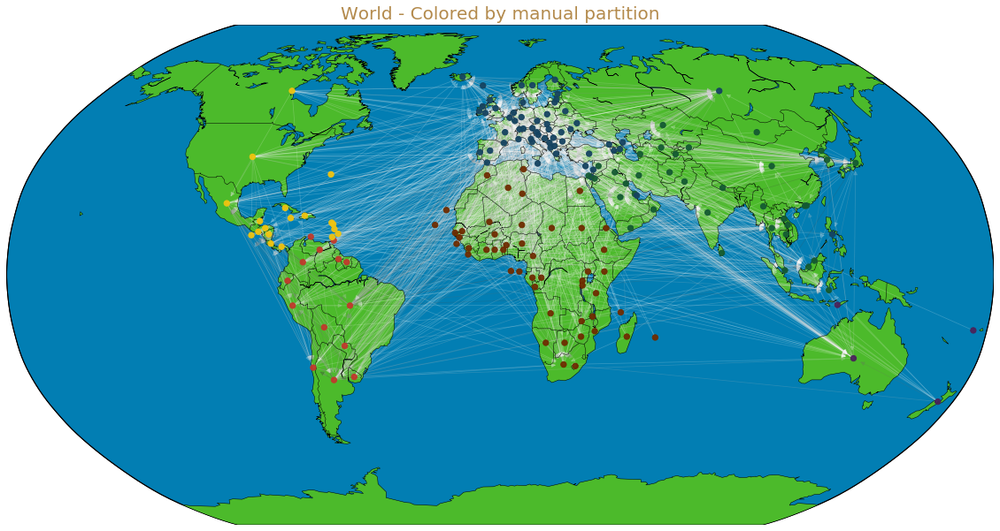

In [24]:
colorsManualPartition = [continentToColor[continentMap[n]] for n in G.nodes]
drawWorldMap(40, colorsManualPartition, 'Colored by manual partition')

When all countries manually have been partioned by their location into Asia, Africa, Europe, South America, North America or Australia (or as seen on the map above) then the partition only has a modularity of 0.15, which is really not a high modularity. This means that the countries in the world regarding international football are all interonnected and not easy to partion.

# Distributions

This section will focus on different distributions. Both the degree distributions but also the distribution of the age, height and weight of the different football players based on their position on the pitch.

### Out degree distribution

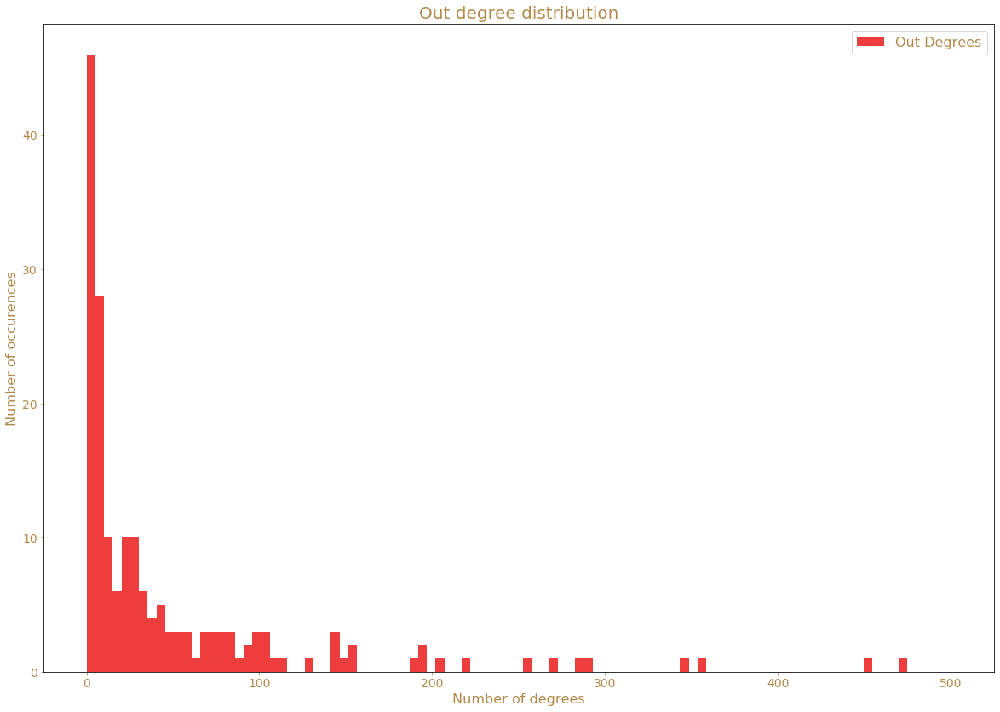

In [25]:
outDegrees = dict(G.out_degree(weight="weight")).values()

bins = np.linspace(0, 500, 100)

plt.hist(outDegrees, bins, alpha=1, color="#EE3D3D", label="Out Degrees")
plt.title("Out degree distribution", fontsize=20)
plt.xlabel("Number of degrees", fontsize=16)
plt.ylabel("Number of occurences", fontsize=16)
plt.tick_params(axis='both', which='major', labelsize=14)
plt.tick_params(axis='both', which='minor', labelsize=14)
plt.legend()
plt.savefig('Figures/Distribution out degree.png', bbox_inches='tight', transparent=True)
plt.show()

As seen from the out degree distribution above, the network mostly contains countries with a small out degree and only a few with a large out degree. This means that a lot of countries do not benefit a lot from international players, while a few countries benefits a whole lot and uses many players from other nationalities.

This means the out degree distribution follows a power law distribution, which is normal to see in real world networks. The Barabasi-Albert model is a random graph, which follows the same properties.

### In degree distribution

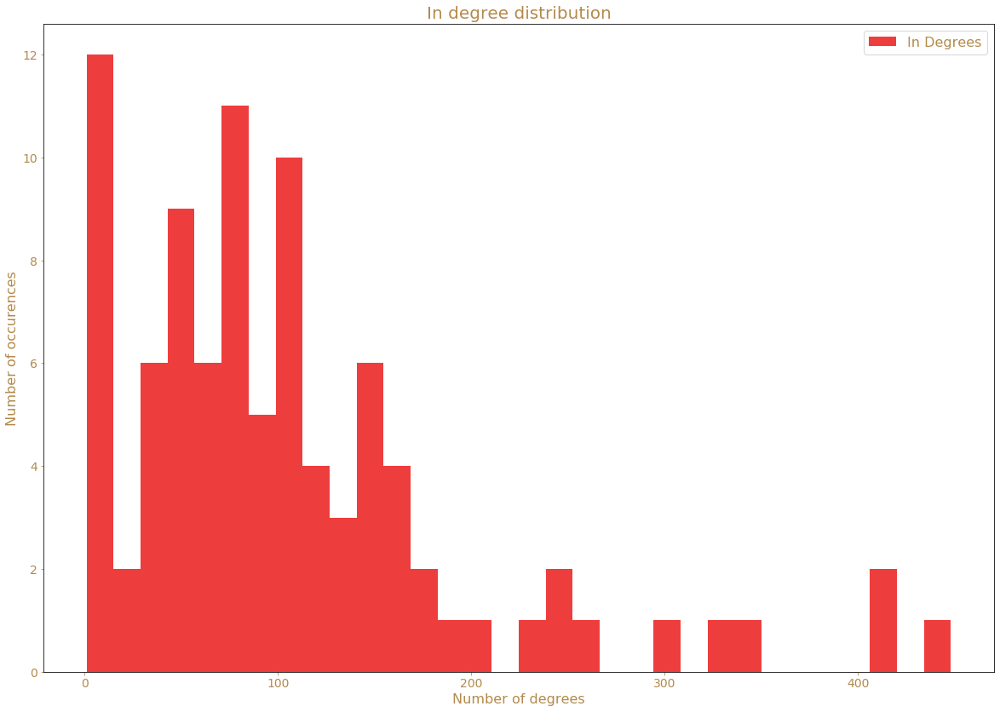

In [26]:
inDegrees = [ v for v in dict(G.in_degree(weight="weight")).values() if v > 0]

bins = 32

plt.hist(inDegrees, bins, alpha=1, color="#EE3D3D", label="In Degrees")
plt.title("In degree distribution", fontsize=20)
plt.xlabel("Number of degrees", fontsize=16)
plt.ylabel("Number of occurences", fontsize=16)
plt.tick_params(axis='both', which='major', labelsize=14)
plt.tick_params(axis='both', which='minor', labelsize=14)
plt.legend()
plt.savefig('Figures/Distribution in degree.png', bbox_inches='tight', transparent=True)
plt.show()

When looking at the in degrees it seems that still only a few countries have a high degree, which means only a few countries contribute a lot to international football. But instead of a lot of countries with low degree, there are a lot of countries with a degree of around 100. So this means almost all countries benefits from players from different nationalities.

It can also be seen that many countries have a in degree of 0, but that is because players from every league in the world could not be gathered.

### Age distribution

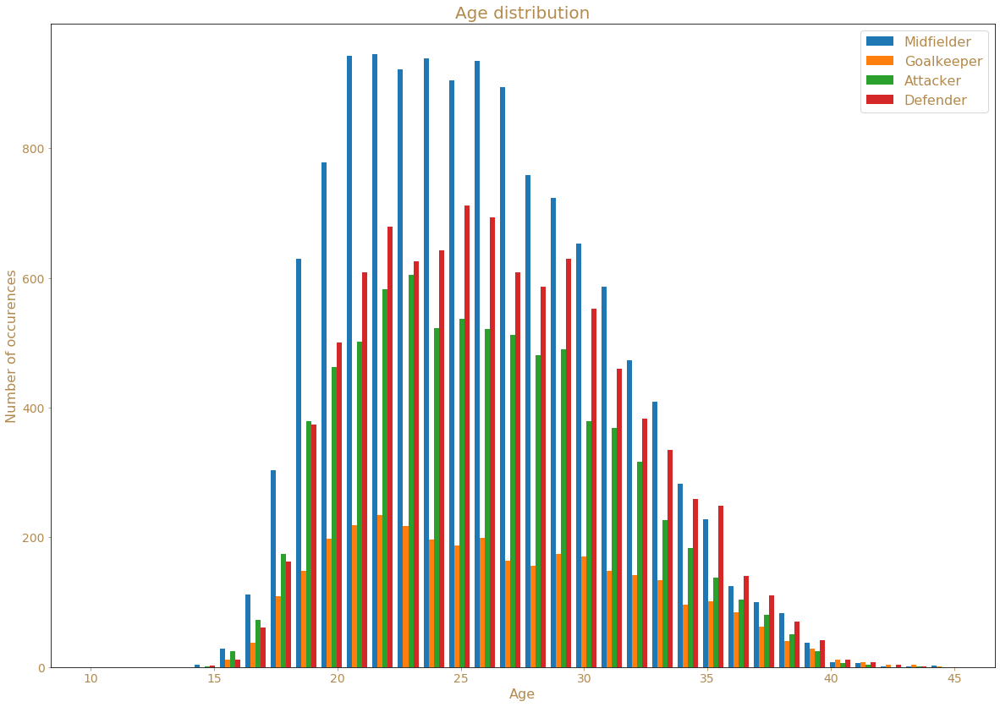

In [27]:
ages = {}
for i, position in enumerate(playerData["position"]) :
    age = playerData["age"][i]
    if position in ages :
        ages[position].append(age)
    else :
        ages[position] = [age]

bins = np.linspace(10, 45, 35)

plt.hist([ages["Midtfielder"], ages["Goalkeeper"], ages["Attacker"], ages["Defender"]], bins, label=['Midfielder', 'Goalkeeper', 'Attacker', 'Defender'])
plt.title("Age distribution", fontsize=20)
plt.xlabel("Age", fontsize=16)
plt.ylabel("Number of occurences", fontsize=16)
plt.tick_params(axis='both', which='major', labelsize=14)
plt.tick_params(axis='both', which='minor', labelsize=14)
plt.legend()
plt.savefig('Figures/Distribution age.png', bbox_inches='tight', transparent=True)
plt.show()

From the age distribution above it can be seen that Midtfielders, Attackers and Defenders peaks at around 24 years, where the age of the Goalkeepers are more spread out. 

### Height distribution

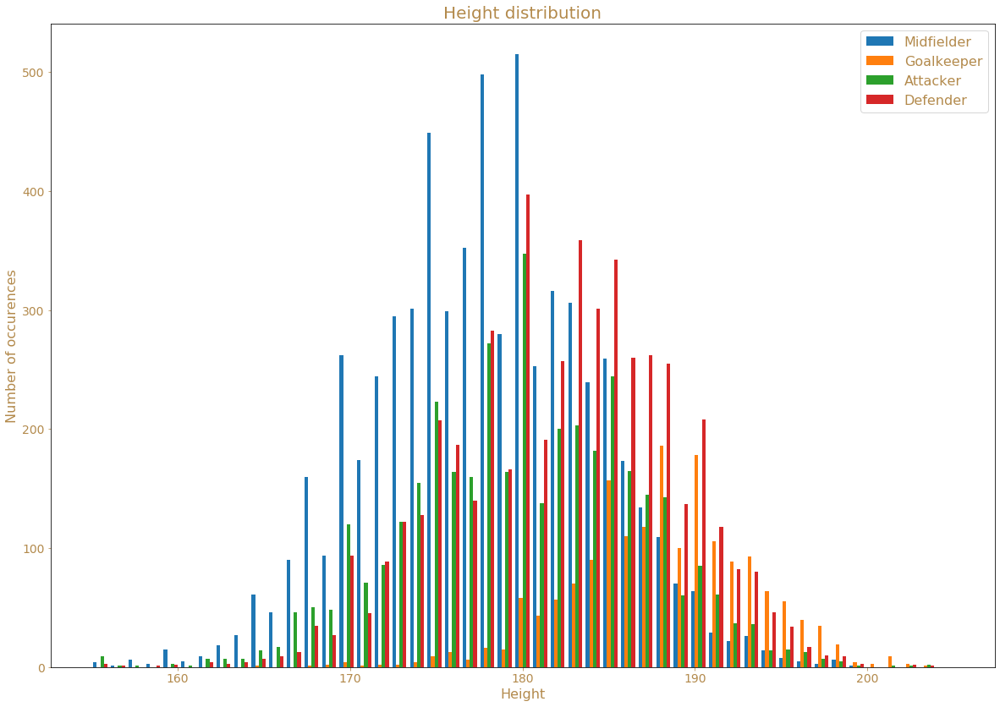

In [28]:
heights = {}
for i, position in enumerate(playerData["position"]) :
    height = playerData["height"][i]
    if height != "-" :
        if position in heights :
            heights[position].append(int(height))
        else :
            heights[position] = [int(height)]

bins = np.linspace(155, 205, 50)

plt.hist([heights["Midtfielder"], heights["Goalkeeper"], heights["Attacker"], heights["Defender"]], bins, label=['Midfielder', 'Goalkeeper', 'Attacker', 'Defender'])
plt.title("Height distribution", fontsize=20)
plt.xlabel("Height", fontsize=16)
plt.ylabel("Number of occurences", fontsize=16)
plt.tick_params(axis='both', which='major', labelsize=14)
plt.tick_params(axis='both', which='minor', labelsize=14)
plt.legend()
plt.savefig('Figures/Distribution height.png', bbox_inches='tight', transparent=True)
plt.show()

From the height distribution it can be seen that the goalkeeprs are in general the heighest, which makes sense as they are supposed to defend a big goal. The Attackers and Defenders are also both tall in general, as they both compete in air-duels to get the ball. The Midtfielders on the other hand are smaller, this makes sense as they not typically are getting into air-duels.

### Weight distribution

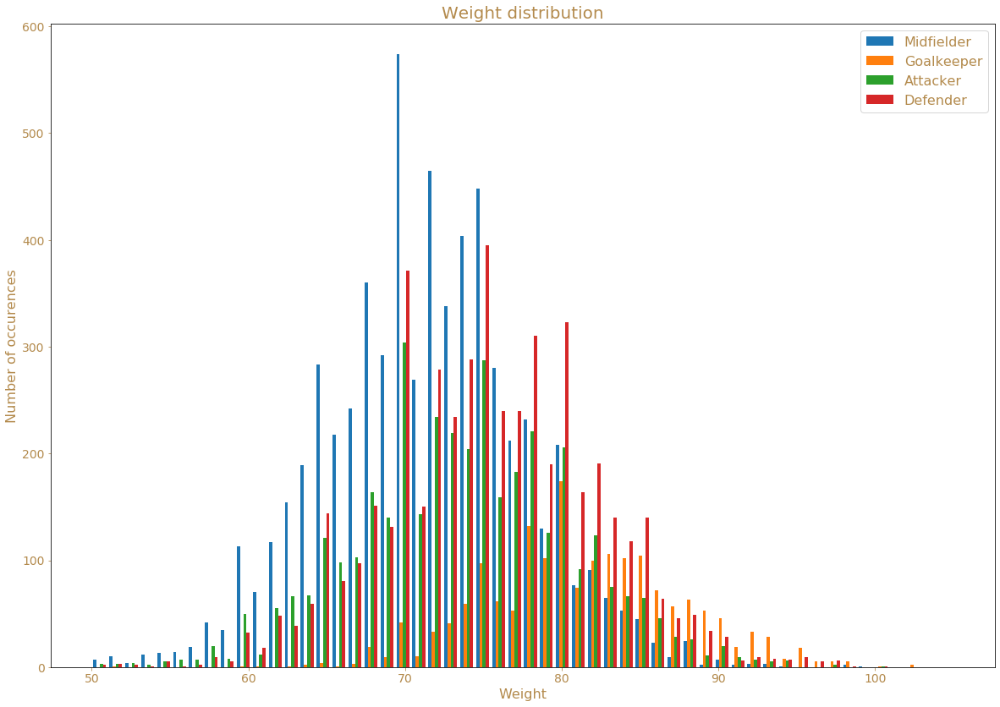

In [29]:
weights = {}
for i, position in enumerate(playerData["position"]) :
    weight = playerData["weight"][i]
    try :
        if position in weights :
            weights[position].append(int(weight))
        else :
            weights[position] = [int(weight)]
    except :
        dummy = 1

bins = np.linspace(50, 105, 55)

plt.hist([weights["Midtfielder"], weights["Goalkeeper"], weights["Attacker"], weights["Defender"]], bins, label=['Midfielder', 'Goalkeeper', 'Attacker', 'Defender'])
plt.title("Weight distribution", fontsize=20)
plt.xlabel("Weight", fontsize=16)
plt.ylabel("Number of occurences", fontsize=16)
plt.tick_params(axis='both', which='major', labelsize=14)
plt.tick_params(axis='both', which='minor', labelsize=14)
plt.legend()
plt.savefig('Figures/Distribution weight.png', bbox_inches='tight', transparent=True)
plt.show()

From the weight distribution it shows the same picture. Goalkeeprs are the heaviest as they do not need to be as fast at the other players, but instaed need to be able to withstand physical contact. Attackers and Defenders are again around the same when it comes to weight as they also both need to get in physical contact all the time, where Midtfielders have to be fast and agile.

### Se which countries produces how many of each players

In [30]:
#Creatng a map over how the positions should be valued out from a 4-4-2 lineup.
positionValues = {
    "Goalkeeper" : 11.0/1.0,
    "Defender" : 11.0/4.0,
    "Midtfielder" : 11.0/4.0,
    "Attacker" : 11.0/2.0
}

#Computes how many players each country makes for each position with the corresponding weight.
countries = {}
for i, nationality in enumerate(playerData["nationality"]) :
    position = playerData["position"][i]
    if position in positionValues :
        if nationality in countries:
            if position in countries[nationality] :
                countries[nationality][position] += positionValues[position]
            else :
                countries[nationality][position] = positionValues[position]
        else :
            countries[nationality] = {position : positionValues[position]}
        if "Total" in countries[nationality] :
            countries[nationality]["Total"] += positionValues[position]
        else :
            countries[nationality]["Total"] = positionValues[position]

In [31]:
#Compute the values in percentage
countriesPercentage = {}
for nationality in countries :
    countriesPercentage[nationality] = {}
    for position in countries[nationality] :
        if position != "Total" :
            countriesPercentage[nationality][position] = countries[nationality][position]/countries[nationality]["Total"] * 100
            
#Makes the map into a dataframe
countries = [c for c in countriesPercentage.keys()]
df = pd.DataFrame([countriesPercentage[dic] for dic in countriesPercentage], index=countries)
df.head(50)

,Goalkeeper,Midtfielder,Attacker,Defender
brasilien,20.898642,23.789620,36.711947,18.599791
england,28.301887,22.523585,27.830189,21.344340
holland,15.658363,18.861210,41.992883,23.487544
kroatien,28.787879,22.222222,29.545455,19.444444
guinea,5.714286,27.142857,51.428571,15.714286
senegal,14.159292,19.026549,51.327434,15.486726
egypten,16.275430,32.707355,30.359937,20.657277
spanien,25.334523,24.799286,30.865299,19.000892
schweiz,36.792453,26.179245,21.698113,15.330189
skotland,23.000000,29.750000,27.000000,20.250000


So as it can be seen in the dataframe 36.7% of the players Brazil deliver are attackers and only 18.6% are defenders. And when glansing down the dataframe it can be seen that almost all the countries in Africa deliver mostly attackers, while many European countries deliver more goalkeepers.

# Top countries

This section compiles a dataframe with the top countries oredered by in and out degrees along with their centralities and how international their top league is.

In [32]:
#Computing the top countries ordered by in degrees and their other stats
inDegrees = dict(G.in_degree(weight="weight"))
topIn = [ c for c, d in [(k, inDegrees[k]) for k in sorted(inDegrees, key=inDegrees.get, reverse=True)][:10]]
topInDegrees = [inDegrees[country] for country in topIn]
topInBetween = [nx.betweenness_centrality(G, weight="weight")[country] for country in topIn]
topInEigen = [nx.eigenvector_centrality(G, weight="weight")[country] for country in topIn]

#Computing the top countries ordered by out degrees and their other stats
outDegrees = dict(G.out_degree(weight="weight"))
topOut = [ c for c, d in [(k, outDegrees[k]) for k in sorted(outDegrees, key=outDegrees.get, reverse=True)][:10]]
topOutdegrees = [outDegrees[country] for country in topOut]
topOutBetween = [nx.betweenness_centrality(G, weight="weight")[country] for country in topOut]
topOutEigen = [nx.eigenvector_centrality(G, weight="weight")[country] for country in topOut]

In [33]:
#Computing how international a country's league is
totalPlayersInCountry = { nationality : -1 for nationality in set(playerData["nationality"])}
for country in playerData["club_nationality"] :
    if country in totalPlayersInCountry :
        totalPlayersInCountry[country] += 1
    else :
        totalPlayersInCountry[country] = 1
        
internationalPlayersPercentage = {country : (G.in_degree(country, weight="weight") / totalPlayersInCountry[country])*100 for country in totalPlayersInCountry}

topInInternational = [internationalPlayersPercentage[country] for country in topIn]
topOutInternational = [internationalPlayersPercentage[country] for country in topOut]

In [34]:
#Compiling the dataframes
data = {"Country" : topIn,
       "In Degree" : topInDegrees,
       "Betweeness Centrality" : topInBetween,
       "Eigenvector Centrality" : topInEigen,
       "International players %" : topInInternational}
df_in = pd.DataFrame(data) 

data = {"Country" : topOut,
       "Out Degree" : topOutdegrees,
       "Betweeness Centrality" : topOutBetween,
       "Eigenvector Centrality" : topOutEigen,
       "International players %" : topOutInternational}
df_out = pd.DataFrame(data) 

display(df_in, df_out)

,Country,In Degree,Betweeness Centrality,Eigenvector Centrality,International players %
0,italien,448,0.013282,0.188522,54.237288
1,england,417,0.012034,0.414732,61.323529
2,portugal,409,0.027404,0.071822,62.923077
3,frankrig,338,0.021282,0.102258,45.552561
4,belgien,328,0.014914,0.126256,58.676208
5,tyskland,305,0.011348,0.183802,50.664452
6,tyrkiet,263,0.017058,0.106826,42.556634
7,spanien,245,0.042151,0.098415,39.325843
8,cypern,243,0.009021,0.136491,52.597403
9,graekenland,227,0.020178,0.111643,47.689076


,Country,Out Degree,Betweeness Centrality,Eigenvector Centrality,International players %
0,brasilien,1001,0.020084,3.890047e-03,7.172557
1,argentina,472,0.013364,8.181936e-03,12.915129
2,frankrig,450,0.021282,1.022578e-01,45.552561
3,spanien,356,0.042151,9.841502e-02,39.325843
4,serbien,344,0.012886,1.593999e-02,19.587629
5,england,288,0.012034,4.147318e-01,61.323529
6,kroatien,284,0.006951,2.984369e-02,31.790123
7,nigeria,269,0.002107,6.288546e-34,11.971831
8,colombia,256,0.000000,5.164895e-50,-0.000000
9,portugal,220,0.027404,7.182161e-02,62.923077


As assumed, countries with high in degree has a high international player percentage, as they are getting a lot of players from other nationalities.

When it comes to out degrees, many countries with high out degree has a low international player percentage compared to the countries with a high in degree. 

Looking at the eigenvector centralities for the countries with high out degree, they are also in general lower compared to the countries with high in degree.
When it comes to betweeness centralities it also seems to be higher for the countries with the highest in degree.

# Wordclouds

This section focus on makes wordclouds for the different liga news and making sentimental analysis of them. The wordclouds will be used to indicate which topics are discussed in the different leagues and not are discussed in all of the leagues. 

That can be done with TF-IDF, which indicates how unique and powerful(how much it appears in a document) a word is in a document compared to other documents. The wordclouds will then be contructed from the TF-IDF values of the words for the different leagues.

In [35]:
#Function to return true if a word is a valid toen
def wordIsToken(word) :
    return word not in stopwords and word not in string.punctuation and not word.isdigit()

In [36]:
#Loading the news from files and putting them into their respective documents
ligas = ["BundesligaNews", "EredivisieNews", "LaLigaNews", "Ligue1News", "PremierLeagueNews", "SerieANews"]
ligaDocuments = {liga : [] for liga in ligas} #All tokens in on list
ligaNewsTokens = {liga : [] for liga in ligas} #Tokens split per news

stopwords = nltk.corpus.stopwords.words('english')
lancaster = LancasterStemmer()

for liga in ligas :
    file = open("{}.txt".format(liga), "r", encoding="utf8")
    for news in file :
        news = news.replace(".", " ")
        #Only extracts the tokens that we allow (in lowercase) and are stemmed
        newTokens = [lancaster.stem(word.lower()) for word in nltk.word_tokenize(news) if wordIsToken(lancaster.stem(word.lower()))]
        
        #Assign the tokens to the liga document
        ligaDocuments[liga].extend(newTokens)
        ligaNewsTokens[liga].append(newTokens)


In [37]:
#Method for computing TF for a document
def getTF(document) :
    tf = {}
    for word in document :
        if word in tf :
            tf[word] += 1
        else :
            tf[word] = 1
    return tf

#Compute TFs
TFs = {document : getTF(ligaDocuments[document]) for document in ligaDocuments}

In [38]:
#Compute IDF
IDF= {}
for word in set([j for i in ligaDocuments.values() for j in i]) :
    wordCount = 0
    for document in ligaDocuments.values() :
        if word in document :
            wordCount += 1
    IDF[word] = math.log10(len(ligaDocuments) / wordCount)

In [39]:
#Calculate TF-IDF for each Liga
TF_IDFs = {liga : {} for liga in ligas}

for liga in ligas :
    TF_IDFs[liga] = {word : TFs[liga][word] * IDF[word] for word in TFs[liga]}

In [40]:
#Function to make a wordcloud for the news of a liga
def makeWC(liga) :
    mask = imread('{}.PNG'.format(liga), flatten=True)
    wordcloud = WordCloud(
                          stopwords=STOPWORDS,
                          background_color='white',
                          width=1800,
                          height=1400,
                          collocations=False,
                          mask=mask
                         ).generate_from_frequencies(TF_IDFs[liga])
    
    plt.imshow(wordcloud)
    plt.axis('off')
    plt.title("Word cloud for {}".format(liga), fontsize=20)

C:\Users\schmi\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  This is separate from the ipykernel package so we can avoid doing imports until
C:\Users\schmi\Anaconda3\lib\site-packages\wordcloud\wordcloud.py:721: UserWarning: mask image should be unsigned byte between 0 and 255. Got a float array
  warnings.warn("mask image should be unsigned byte between 0"


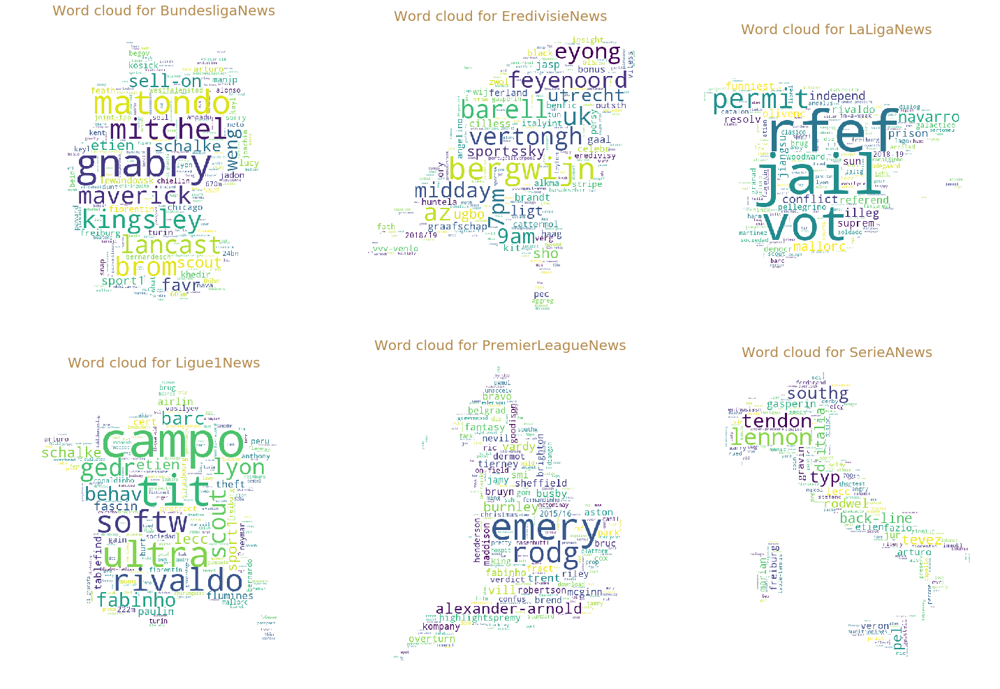

In [41]:
#Plots the wordcloud for each of the leagues
fig = plt.figure()
for i, liga in enumerate(ligas) :
    ax = fig.add_subplot(2,3,i+1)
    wordcloud = makeWC(liga)
    ax.axis('off')

plt.tight_layout()
plt.savefig('Figures/Wordcoulds.png', bbox_inches='tight', transparent=True)
plt.show()

So as it can be seen from the wordclouds many of the words are names of the top players in the different leagues. And looking at the news from the Spanish La Liga it mentions 'RFEF'(The Spanish football union) and 'jail', which both are topic that are well discussed in Spain as many players in the Spanish league has been accused for hiding their money.

### Sentimental analysis

Now the sentimental value of the news in the different leagues will be investigated. It will be used to see which of the leagues that are the most violent.

In [42]:
#Loads the sentimental values
df_sentimentals = pd.read_csv("SentimentalValues.txt", sep="\t")
df_sentimentals.set_index('word', inplace=True)
df_sentimentals.head()

,happiness_rank,happiness_average,happiness_standard_deviation,twitter_rank,google_rank,nyt_rank,lyrics_rank
word,,,,,,,
laughter,1,8.50,0.9313,3600,--,--,1728
happiness,2,8.44,0.9723,1853,2458,--,1230
love,3,8.42,1.1082,25,317,328,23
happy,4,8.30,0.9949,65,1372,1313,375
laughed,5,8.26,1.1572,3334,3542,--,2332


In [43]:
#Function for calculating the sentimental value of a list of tokens
def calculateSentiment(tokens) :
    df_tokens = pd.DataFrame(index=tokens)
    return pd.concat([df_tokens, df_sentimentals], axis=1, join='inner')['happiness_average'].mean()

In [44]:
#Computes the mean sentimental value for each of the ligas
sentimentalMeans = {}
for liga in ligas :
    sentimentalMeans[liga] = calculateSentiment(ligaDocuments[liga])
    
sentimentalMeans

{'BundesligaNews': 5.543452783558788,
 'EredivisieNews': 5.595676714722543,
 'LaLigaNews': 5.524402189365944,
 'Ligue1News': 5.541374210224,
 'PremierLeagueNews': 5.552895807199478,
 'SerieANews': 5.539868431544508}

As it can be seen from the sentimental means of the news from the different ligas, they are all quite similar. This makes sense as the news mostly are written to reflect facts. So news are in general neutral in their language and the same aplies for these news.

### Distribution for news and ligas

In [45]:
#Computes the sentimental means for the different news in the different leagues
ligaNewsSentimentalDistribution = {liga : [] for liga in ligas}

for liga in ligas :
    for newsTokens in ligaNewsTokens[liga] :
        mean = calculateSentiment(newsTokens)
        if not math.isnan(mean) :
            ligaNewsSentimentalDistribution[liga].append(calculateSentiment(newsTokens))

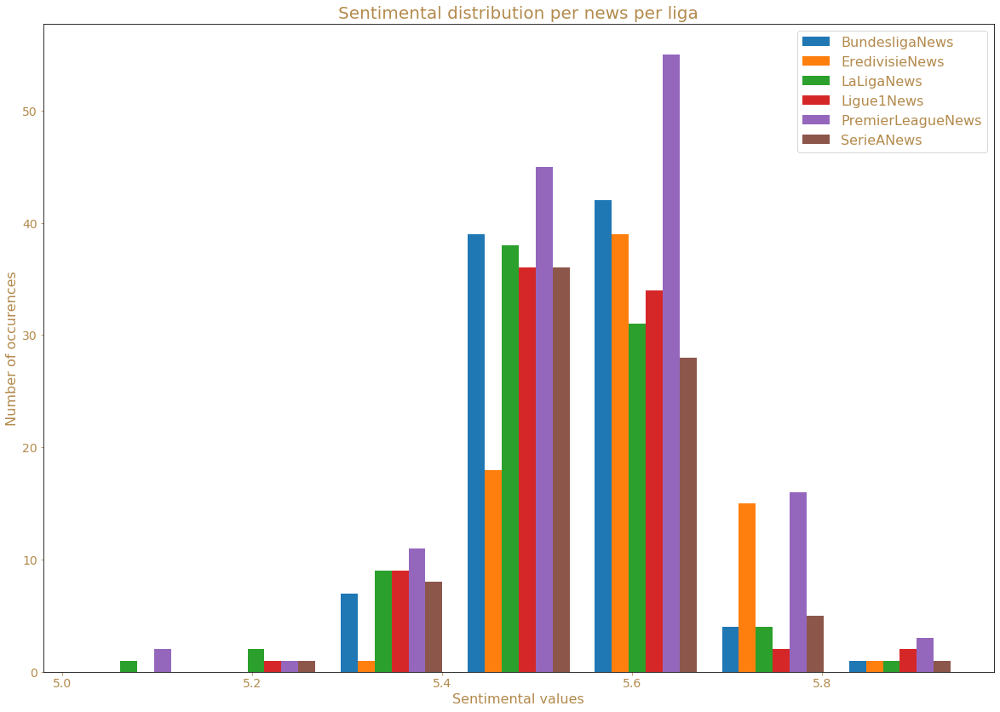

In [46]:
bins = np.linspace(0, 9, 1)

plt.hist([l for l in ligaNewsSentimentalDistribution.values()], bins=7, label=ligas)
plt.title("Sentimental distribution per news per liga", fontsize=20)
plt.xlabel("Sentimental values", fontsize=16)
plt.ylabel("Number of occurences", fontsize=16)
plt.tick_params(axis='both', which='major', labelsize=14)
plt.tick_params(axis='both', which='minor', labelsize=14)
plt.legend()
plt.savefig('Figures/distribution sentimental news.png', bbox_inches='tight', transparent=True)
plt.show()

As news are written in neutral language, hte sentimental distribution of the news are not expected to vary much. And as the distribution above shows, the news mostly have a sentimental value arround 5.6 which is neutral. And the minimun and maximum sentimental value of a news is respectively around 5 and around 5.9. So as expected they do not vary much.

So now only the positive and negative news will be investigated. The negative news are defined by a sentimental value of less than $m-2*sd$ and positive news by a sentimental value of more than $m+2*sd$. This will be done for all of the leagues.

## Positive words

In [47]:
#Function for making a wordcloud (same as before but with extra info for the title)
def makeWC(tokens, extra) :
    mask = imread('{}.PNG'.format(liga), flatten=True)
    wordcloud = WordCloud(
                          stopwords=STOPWORDS,
                          background_color='white',
                          width=1800,
                          height=1400,
                          collocations=False,
                          mask=mask
                         ).generate(" ".join(tokens))
    
    plt.imshow(wordcloud)
    plt.axis('off')
    plt.title("{} Word cloud for {}".format(extra, liga), fontsize=20)

In [48]:
#Extracts the news with a mean sentimental values of more than m+2*sd
ligaNewsSentimentalDistributionPositive = {liga : [] for liga in ligas}

for liga in ligas :
    for newsTokens in ligaNewsTokens[liga] :
        mean = calculateSentiment(newsTokens)
        if not math.isnan(mean) and mean > (sentimentalMeans[liga]+2*statistics.stdev(ligaNewsSentimentalDistribution[liga])):
            ligaNewsSentimentalDistributionPositive[liga].extend(newsTokens)

C:\Users\schmi\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  This is separate from the ipykernel package so we can avoid doing imports until


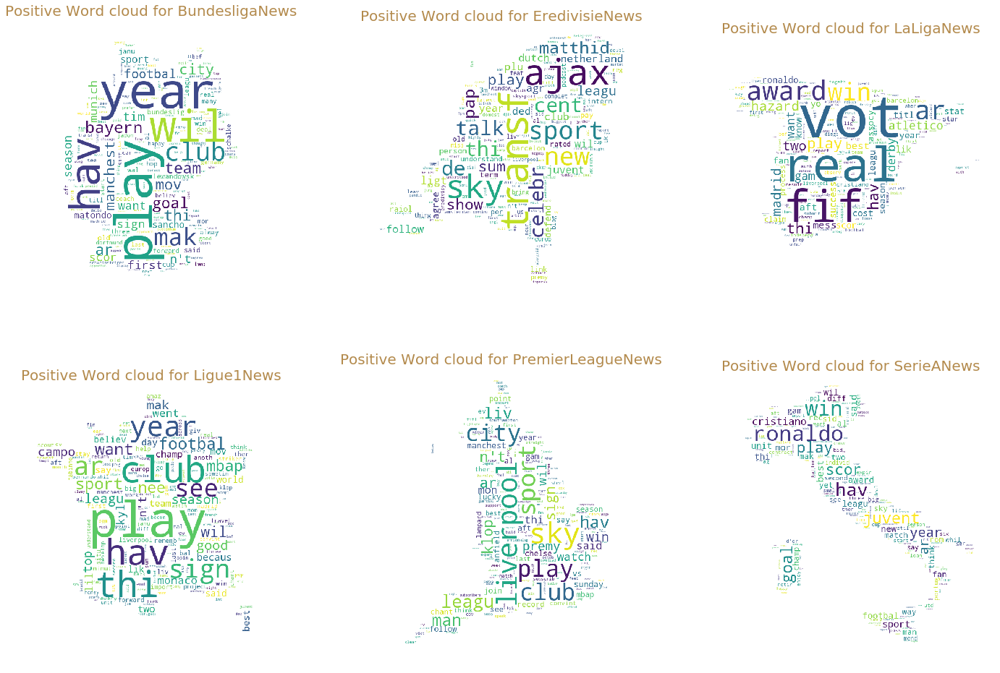

In [49]:
fig = plt.figure()
for i, liga in enumerate(ligas) :
    ax = fig.add_subplot(2,3,i+1)
    wordcloud = makeWC(ligaNewsSentimentalDistributionPositive[liga], "Positive")
    ax.axis('off')

plt.tight_layout()
plt.savefig('Figures/Wordcoulds positive.png', bbox_inches='tight', transparent=True)
plt.show()

As it can be seen from the word clouds for the words from the positive news, the words are still quite neutral. But in general the top clubs and players are being mentioned in the different leagues, like 'Liverpool', 'Ajax' and 'Ronaldo'. But some positive words still occur like 'win', 'award', 'goal' and 'score'.

In [50]:
#Extracts the news with a mean sentimental values of less than m-2*sd
ligaNewsSentimentalDistributionPositive = {liga : [] for liga in ligas}

for liga in ligas :
    for newsTokens in ligaNewsTokens[liga] :
        mean = calculateSentiment(newsTokens)
        if not math.isnan(mean) and mean < (sentimentalMeans[liga]-2*statistics.stdev(ligaNewsSentimentalDistribution[liga])):
            ligaNewsSentimentalDistributionPositive[liga].extend(newsTokens)

C:\Users\schmi\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  This is separate from the ipykernel package so we can avoid doing imports until


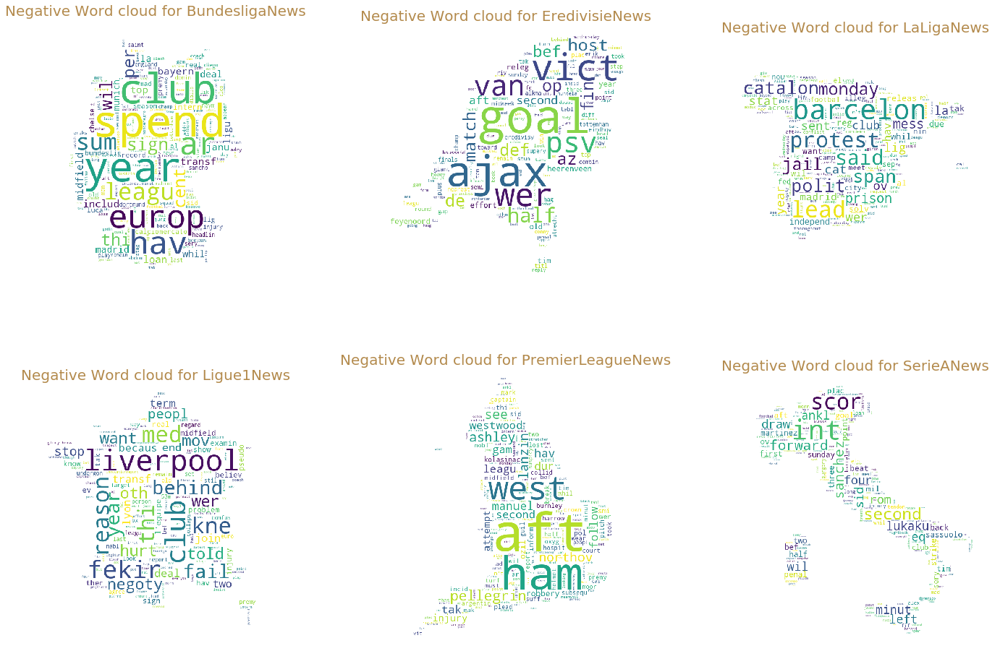

In [51]:
fig = plt.figure()
for i, liga in enumerate(ligas) :
    ax = fig.add_subplot(2,3,i+1)
    wordcloud = makeWC(ligaNewsSentimentalDistributionPositive[liga], "Negative")
    ax.axis('off')

plt.tight_layout()
plt.savefig('Figures/Wordcoulds negative.png', bbox_inches='tight', transparent=True)
plt.show()

It is the same story for words from the negative news. It is mostly mentioning clubs and names who might not have performed as expected. And looking at the Spanish news from La Liga it mentions 'prison' and 'protest' which again refers to Spanish players been accused of hiding their money.

From the different wordclouds of the leagues it can be hard to see whether a league is violent or not. That is due to the fact that news are written in a neutral language.

# Discussion & Conclusion

In general everything went well. The network was a success, but it could however be interesting to look at it if it was closed. So that means only to look at the countries where it was possible extract the players from their top league. That would possibly change the degree distributions and the centrality values.

When it comes to the sentimental analysis it was not the best to look at news, as they are written in neutral language. It for instance have been better to look at tweets from different hooligan groups, which definitely would use the whole sentimental scale. But a drawback to that is, that it would only be possible to look at english speaking hooligan groups, and hence mostly at groups from england. So it would not entirely relate to the international network that was investigated.

Right now this has only been investigated on league level. In the future it could also by nice to investigate on club level. So to see the difference in the top clubs and the lower ranked clubs.

It can be concluded that we have looked into football diersity on international level. But further investigation can be made for better insight.

# Contribution

Most of the code has been written together where Mikkel has been more involved in the data collection and computing and Frederik in the data visualization, video and web page. But we both have been involved in all parts.